In [19]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import os

experiment_list= [
    'two_body_baseline_hnn_tf',
    'two_body_baseline_resnet_layer1',
    'two_body_baseline_resnet_layer2',
    'two_body_kernel2_stride1_2_good',
    'two_body_kernel4_stride2',
    'two_body_kernel8_stride4',
    'two_body_kernel2_stride1',
    'two_body_baseline_vanilla_tf',
]

labels = [
    'HNN',
    'ResnetLayer1',
    'ResnetLayer2',
    'Kernel2Stride1 - 200 epochs',
    'Kernel4Stride2',
    'Kernel8Stride4',
    'Kernel2Stride1 - 400 epochs',
    'Transformer',
]

base_path = '/root/work/dhn-deeplearning'

In [20]:
def get_result_dict(name, variant=None,):
    if 'hnn' in name:
        if variant:
            path_to_result_dict = f'{base_path}/results/ar/{name}/gen_sequence/{variant}/result_dict.npy'
            return np.load(path_to_result_dict, allow_pickle=True).item()
        else:
            raise ValueError('variant must be provided for hnn models (forward_euler or leapfrog)')
    if 'kernel' in name:
        # Need to pick one of the folders within gen_sequence, maybe just pick the first one
        gen_sequence_folders = os.listdir(f'{base_path}/results/ar/{name}/gen_sequence')
        if len(gen_sequence_folders) == 0:
            raise ValueError('No gen_sequence folders found for kernel models')
        gen_sequence_folder = gen_sequence_folders[0]

        path_to_result_dict = f'{base_path}/results/ar/{name}/gen_sequence/{gen_sequence_folder}/result_dict.npy'
        return np.load(path_to_result_dict, allow_pickle=True).item()
    if 'vanilla' in name:
        path_to_result_dict = f'{base_path}/results/ar/{name}/gen_sequence/vanilla/result_dict.npy'
        return np.load(path_to_result_dict, allow_pickle=True).item()
    if 'resnet' in name:
        path_to_result_dict = f'{base_path}/results/ar/{name}/gen_sequence/vanilla/result_dict.npy'
        return np.load(path_to_result_dict, allow_pickle=True).item()

def get_cond_dict(name, variant=None):
    if 'hnn' in name:
        if variant:
            path_to_cond = f'{base_path}/results/ar/{name}/gen_sequence/{variant}/cond_dict.npy'
            return np.load(path_to_cond, allow_pickle=True).item()
        else:
            raise ValueError('variant must be provided for hnn models (forward_euler or leapfrog)')
    if 'kernel' in name:
        # Need to pick one of the folders within gen_sequence, maybe just pick the first one
        gen_sequence_folders = os.listdir(f'{base_path}/results/ar/{name}/gen_sequence')
        if len(gen_sequence_folders) == 0:
            raise ValueError('No gen_sequence folders found for kernel models')
        gen_sequence_folder = gen_sequence_folders[0]
        path_to_cond = f'{base_path}/results/ar/{name}/gen_sequence/{gen_sequence_folder}/cond_dict.npy'
        return np.load(path_to_cond, allow_pickle=True).item()
    if 'vanilla' in name:
        path_to_cond = f'{base_path}/results/ar/{name}/gen_sequence/vanilla/cond_dict.npy'
        return np.load(path_to_cond, allow_pickle=True).item()
    if 'resnet' in name:
        path_to_cond = f'{base_path}/results/ar/{name}/gen_sequence/vanilla/cond_dict.npy'
        return np.load(path_to_cond, allow_pickle=True).item()


In [57]:
name = 'two_body_kernel2_stride1'
# name = 'two_body_baseline_vanilla_tf'
# name = 'two_body_baseline_resnet_layer2'
# name = 'two_body_baseline_hnn_tf'
# variant = 'forward_euler'
# variant = None
base_path = '/root/work/dhn-deeplearning'

data = get_result_dict(name, variant)
cond = get_cond_dict(name, variant)

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


def visualize(
    data,
    cond,
    traj_index=0,
    num_points=None,
    make_animation=True,
    t_per_frame=1,
):
    """
    Visualize one two-body trajectory (GT vs prediction).
    """

    # ---------------------------------------------------------
    # Slice trajectory
    # ---------------------------------------------------------
    t_full = data['t'][traj_index]
    if num_points is None:
        num_points = t_full.shape[0]

    t      = t_full[:num_points]
    q_gt   = data['q_gt'][traj_index][:num_points]
    q_pred = data['q_pred'][traj_index][:num_points]
    p_gt   = data['p_gt'][traj_index][:num_points]
    p_pred = data['p_pred'][traj_index][:num_points]

    r_gt,    theta_gt    = q_gt[:, 0], q_gt[:, 1]
    r_pred,  theta_pred  = q_pred[:, 0], q_pred[:, 1]
    dr_gt,   dtheta_gt   = p_gt[:, 0], p_gt[:, 1]
    dr_pred, dtheta_pred = p_pred[:, 0], p_pred[:, 1]

    # Wrap theta to [0, 2π] for visualization
    theta_wrapped_gt   = theta_gt   % (2 * np.pi)
    theta_wrapped_pred = theta_pred % (2 * np.pi)

    # ---------------------------------------------------------
    # Physical parameters
    # ---------------------------------------------------------
    m1 = float(cond['m1'][traj_index])
    m2 = float(cond['m2'][traj_index])
    M  = m1 + m2
    G  = 1.0

    # ---------------------------------------------------------
    # 1) q–t curves (r, θ vs time)
    # ---------------------------------------------------------
    plt.figure(figsize=(10, 6), dpi=100)
    plt.plot(t, r_gt,              label='r (radial) – GT',   color='C0')
    plt.plot(t, r_pred,            label='r (radial) – pred', color='C1')
    plt.plot(t, theta_wrapped_gt,  label='θ (angle) – GT',    color='C0', linestyle='--')
    plt.plot(t, theta_wrapped_pred,label='θ (angle) – pred',  color='C1', linestyle='--')
    plt.title('Positions vs Time')
    plt.xlabel('Time [s]')
    plt.ylabel('Position [r: distance, θ: rad]')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------
    # 2) dq–t curves (velocities vs time)
    # ---------------------------------------------------------
    plt.figure(figsize=(10, 6), dpi=100)
    plt.plot(t, dr_gt,       label='dr/dt – GT',   color='C0')
    plt.plot(t, dr_pred,     label='dr/dt – pred', color='C1')
    plt.plot(t, dtheta_gt,   label='dθ/dt – GT',   color='C0', linestyle='--')
    plt.plot(t, dtheta_pred, label='dθ/dt – pred', color='C1', linestyle='--')
    plt.title('Velocities vs Time')
    plt.xlabel('Time [s]')
    plt.ylabel('Velocity [dr/dt: distance/s, dθ/dt: rad/s]')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------
    # 3) Phase space
    # ---------------------------------------------------------
    plt.figure(figsize=(10, 6), dpi=100)
    plt.plot(r_gt,       dr_gt,       label='r vs dr/dt – GT',   color='C0', alpha=0.7)
    plt.plot(r_pred,     dr_pred,     label='r vs dr/dt – pred', color='C1', alpha=0.7)
    plt.plot(theta_wrapped_gt,   dtheta_gt,   label='θ vs dθ/dt – GT',   color='C0', linestyle='--', alpha=0.7)
    plt.plot(theta_wrapped_pred, dtheta_pred, label='θ vs dθ/dt – pred', color='C1', linestyle='--', alpha=0.7)
    plt.title('Phase Space')
    plt.xlabel('Position [r: distance, θ: rad]')
    plt.ylabel('Velocity [dr/dt: distance/s, dθ/dt: rad/s]')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------
    # 4) Orbit trajectories (2D, GT vs pred) calculation
    # ---------------------------------------------------------
    # Reduced coordinate → Cartesian
    x_rel_gt   = r_gt   * np.cos(theta_gt)
    y_rel_gt   = r_gt   * np.sin(theta_gt)
    x_rel_pred = r_pred * np.cos(theta_pred)
    y_rel_pred = r_pred * np.sin(theta_pred)

    # Positions of bodies in CoM frame (GT)
    x1_gt = -m2 / M * x_rel_gt
    y1_gt = -m2 / M * y_rel_gt
    x2_gt =  m1 / M * x_rel_gt
    y2_gt =  m1 / M * y_rel_gt

    # Positions of bodies in CoM frame (Pred)
    x1_pred = -m2 / M * x_rel_pred
    y1_pred = -m2 / M * y_rel_pred
    x2_pred =  m1 / M * x_rel_pred
    y2_pred =  m1 / M * y_rel_pred

    plt.figure(figsize=(8, 8), dpi=100)
    # GT
    plt.plot(x1_gt, y1_gt, '-',  label='Body 1 – GT',   color='C0', alpha=0.7)
    plt.plot(x2_gt, y2_gt, '--', label='Body 2 – GT',   color='C0', alpha=0.7)
    # Pred
    plt.plot(x1_pred, y1_pred, '-',  label='Body 1 – pred', color='C1', alpha=0.7)
    plt.plot(x2_pred, y2_pred, '--', label='Body 2 – pred', color='C1', alpha=0.7)

    # Start/end markers (GT)
    plt.plot(x1_gt[0],  y1_gt[0],  'o', color='C0', label='Body 1 start (GT)')
    plt.plot(x2_gt[0],  y2_gt[0],  's', color='C0', label='Body 2 start (GT)')
    plt.plot(0, 0, 'k+', markersize=12, markeredgewidth=2, label='Center of Mass')

    plt.title(f'Orbit Trajectories (GT vs Pred)\n m1={m1:.2f}, m2={m2:.2f}')
    plt.xlabel('x position')
    plt.ylabel('y position')
    plt.axis('equal')
    plt.grid(True, alpha=0.3)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------
    # 5) Animated orbit (GT + Pred)
    # ---------------------------------------------------------
    if not make_animation:
        return

    # Determine plot limits based on both GT and Pred
    all_x = np.concatenate([x1_gt, x2_gt, x1_pred, x2_pred])
    all_y = np.concatenate([y1_gt, y2_gt, y1_pred, y2_pred])
    r_max = np.max(np.sqrt(all_x**2 + all_y**2))
    plot_margin = 0.2 * r_max
    xlim = (-r_max - plot_margin, r_max + plot_margin)
    ylim = (-r_max - plot_margin, r_max + plot_margin)

    fig, ax = plt.subplots(figsize=(6, 6), dpi=100)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_aspect('equal')
    ax.set_title(f'Two-Body Orbit Animation (GT vs Pred)\nBlue=GT, Orange=Pred')
    ax.set_xlabel('x position')
    ax.set_ylabel('y position')
    ax.grid(True, alpha=0.3)

    # CoM marker
    ax.plot(0, 0, 'k+', markersize=12, markeredgewidth=2, label='CoM')

    # --- GT Objects (Blue C0) ---
    body1_gt, = ax.plot([], [], 'o', color='C0', markersize=8, label='Body 1 (GT)')
    body2_gt, = ax.plot([], [], 's', color='C0', markersize=8, label='Body 2 (GT)')
    trace1_gt, = ax.plot([], [], '-', color='C0', alpha=0.4)
    trace2_gt, = ax.plot([], [], '--', color='C0', alpha=0.4)
    conn_gt,   = ax.plot([], [], '-', color='gray', alpha=0.3, linewidth=1)

    # --- Pred Objects (Orange C1) ---
    body1_pred, = ax.plot([], [], 'o', color='C1', markersize=8, label='Body 1 (Pred)')
    body2_pred, = ax.plot([], [], 's', color='C1', markersize=8, label='Body 2 (Pred)')
    trace1_pred, = ax.plot([], [], '-', color='C1', alpha=0.4)
    trace2_pred, = ax.plot([], [], '--', color='C1', alpha=0.4)

    # Time label
    time_text = ax.text(
        0.02, 0.98, '', transform=ax.transAxes, va='top', fontsize=12,
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    )

    ax.legend(loc='upper right', fontsize='small', framealpha=0.8)

    def update(frame):
        idx = frame * t_per_frame
        if idx >= len(t):
            idx = len(t) - 1

        # Current coords
        x1g, y1g = x1_gt[idx], y1_gt[idx]
        x2g, y2g = x2_gt[idx], y2_gt[idx]
        x1p, y1p = x1_pred[idx], y1_pred[idx]
        x2p, y2p = x2_pred[idx], y2_pred[idx]

        # Update Bodies
        body1_gt.set_data([x1g], [y1g])
        body2_gt.set_data([x2g], [y2g])
        body1_pred.set_data([x1p], [y1p])
        body2_pred.set_data([x2p], [y2p])

        # Update Connection (GT only)
        conn_gt.set_data([x1g, x2g], [y1g, y2g])

        # Update Traces - only show trace up to current index (starting from index 1 to avoid showing trace from beginning)
        # Only show trace if we have at least 2 points (idx >= 1)
        if idx >= 1:
            # Build trace from index 1 to current idx (inclusive) to avoid showing trace from the very first point
            trace_start = 1
            trace_end = idx + 1
            trace1_gt.set_data(x1_gt[trace_start:trace_end], y1_gt[trace_start:trace_end])
            trace2_gt.set_data(x2_gt[trace_start:trace_end], y2_gt[trace_start:trace_end])
            trace1_pred.set_data(x1_pred[trace_start:trace_end], y1_pred[trace_start:trace_end])
            trace2_pred.set_data(x2_pred[trace_start:trace_end], y2_pred[trace_start:trace_end])
        else:
            # No trace for the first frame
            trace1_gt.set_data([], [])
            trace2_gt.set_data([], [])
            trace1_pred.set_data([], [])
            trace2_pred.set_data([], [])

        # Update Time
        time_text.set_text(f'Time: {t[idx]:.2f} s')

        return (body1_gt, body2_gt, trace1_gt, trace2_gt, conn_gt,
                body1_pred, body2_pred, trace1_pred, trace2_pred, time_text)

    num_frames = max(1, len(t) // t_per_frame)
    ani = FuncAnimation(fig, update, frames=num_frames, blit=True, interval=50)

    ani.save("orbit_animation-dhn.gif", writer="pillow", fps=20)
    plt.close(fig)
    return HTML(ani.to_jshtml())

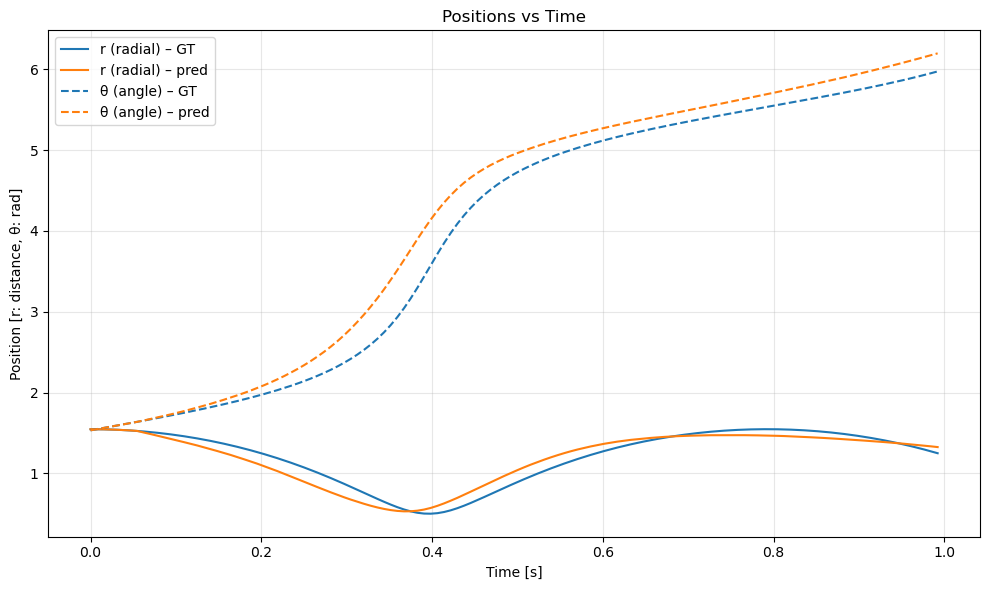

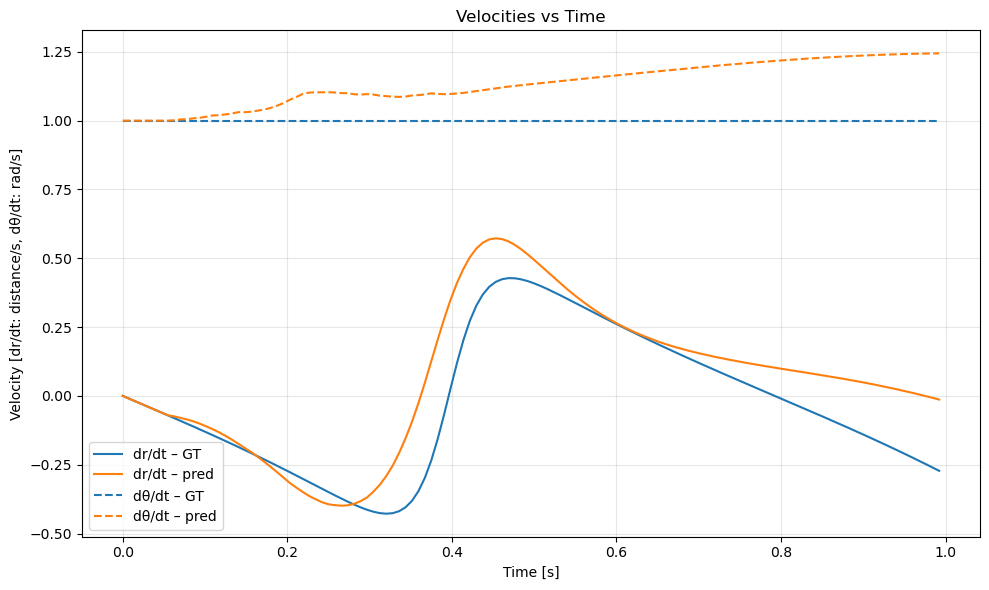

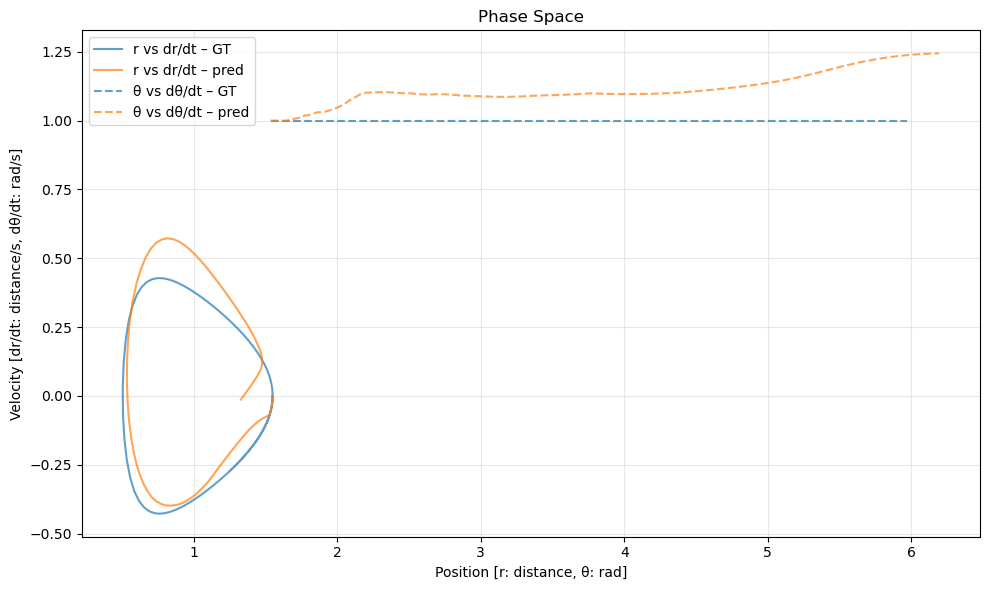

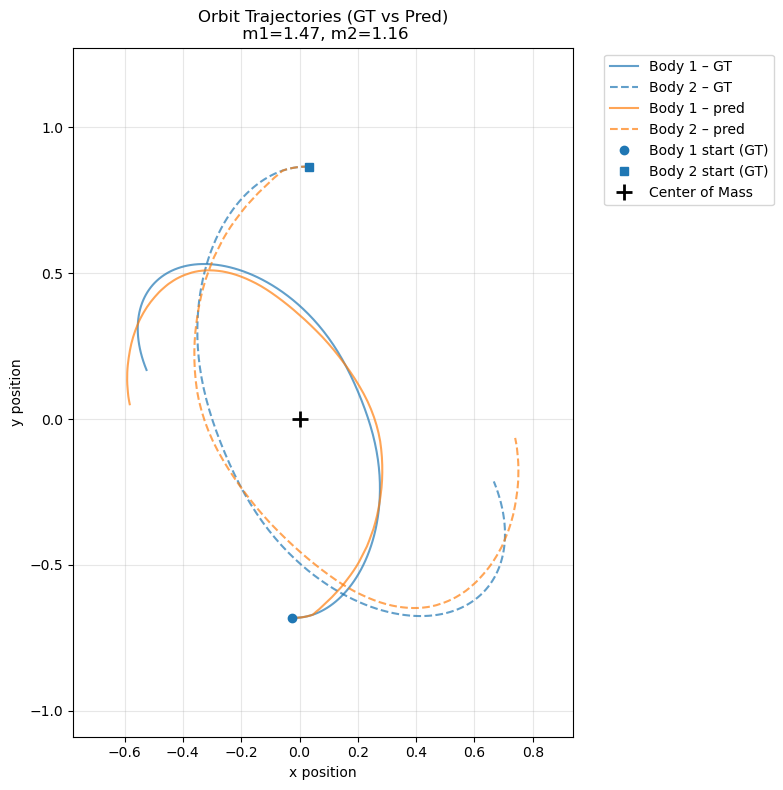

In [64]:
visualize(data, cond, traj_index=1, num_points=None, make_animation=True, t_per_frame=1)